## Projeto de Data Mining - Análise de Investimentos em ações e fundos do mercado Brasileiro

In [ ]:
'''#código automação ações part 1
from selenium import webdriver
from time import sleep as sl
import pandas as pd
import pyautogui as py
#a biblioteca selenium fará a parte da automação juntamente com a biblioteca pyautogui

#a biblioteca sleep faz o código ter um delay, é útil para quando um site demora para carregar, já que esse delay pode nos 
#prevenir de erros desnecessários do programa por causa dessa demora

#a biblioteca pandas nos serviu na criação de DataFrames e na leitura de arquivos em excel pelo python

df = pd.read_excel('statusinvest-busca_acoes.xlsx')
#planilha em excel adquirida por meio do site statusinvest, no qual nos fornece-a gratuitamente 
display(df)
# df será a variável que terá nosso DataFrame'''


In [ ]:
'''#código automação ações part 2
#AÇÕES
navegador = webdriver.Chrome()
navegador.get('https://www.google.com')
link = 'https://statusinvest.com.br/'
navegador.get(link)
print(link)
#as funcões acima servem para o selenium entrar no site statusinvest, onde tiraremos nossas informações

py.keyDown('win')
py.press('up')
py.keyUp('win')

nome = []
setor = []
cot_atual = []
dy = []
pvp  = []
cagr = []
liqdia = []
caixa = []
maxima = []
minima = []
patliq = []
tipo = []
lucro = []
#estas listas acima são todas as informações que pegaremos do site, nas quais serão transformadas em um DataFrame depois

for c in df['TICKER']:
    #Looping 'for' para pegar cada ticker(código) das ações no DataFrame 
    nome.append(c)
    navegador.find_element('xpath', '//*[@id="main-nav-nav"]/div/div/div/ul/li[2]/a/i').click()
    navegador.find_element('xpath', '//*[@id="main-search"]/div[1]/span[1]/input[2]').send_keys(c)
    try:
        sl(3.5)
        navegador.find_element('xpath', '//*[@id="main-search"]/div[2]/div/div/a').click()
    except:
        sl(2)
        navegador.find_element('xpath', '//*[@id="main-search"]/div[2]/div/div/a').click()
        
    #tratamento de erro usado aqui para prevenir erros enquanto o programa está funcionando, se houver um 
    #erro o progresso será pausado
    
    sl(1)
    tipo.append(navegador.find_element('xpath', '//*[@id="main-header"]/div[2]/div/div[1]/div/ol/li[2]/a/span').text)
    cot_atual.append(navegador.find_element('xpath', '//*[@id="main-2"]/div[2]/div/div[1]/div/div[1]/div/div[1]/strong').text)
    maxima.append(navegador.find_element('xpath', '//*[@id="main-2"]/div[2]/div/div[1]/div/div[3]/div/div[1]/strong').text)
    minima.append(navegador.find_element('xpath', '//*[@id="main-2"]/div[2]/div/div[1]/div/div[2]/div/div[1]/strong').text)
    dy.append(navegador.find_element('xpath', '//*[@id="main-2"]/div[2]/div/div[1]/div/div[4]/div/div[1]/strong').text)
    
    py.scroll(-1000)
    sl(0.5)
    liqdia.append(navegador.find_element('xpath', '//*[@id="main-2"]/div[2]/div/div[5]/div/div/div[3]/div/div/div/strong').text)
    py.scroll(-900)
    sl(0.5)
    pvp.append(navegador.find_element('xpath', '//*[@id="indicators-section"]/div[2]/div/div[1]/div/div[4]/div/div/strong').text)
    cagr.append(navegador.find_element('xpath', '//*[@id="indicators-section"]/div[2]/div/div[5]/div/div[2]/div/div/strong').text)
    
    navegador.find_element('xpath', '//*[@id="main-2"]/div[1]/div/div/ul/li[2]/a').click()
    sl(0.5)
    py.scroll(-500)
    sl(0.5)
    patliq.append(navegador.find_element('xpath', '//*[@id="company-section"]/div[1]/div/div[2]/div[1]/div/div/strong').text)
    setor.append(navegador.find_element('xpath', '//*[@id="company-section"]/div[1]/div/div[3]/div/div[1]/div/div/div/a/strong').text)
    
    navegador.find_element('xpath', '//*[@id="main-2"]/div[1]/div/div/ul/li[3]/a').click()
    sl(1)
    py.scroll(-1300)
    sl(1)
    try:
        caixa.append(navegador.find_element('xpath', '//*[@id="contabil-section"]/div[1]/div/div[3]/div[1]/div[1]/table/tbody/tr[1]/td[2]/span').text)
        lucro.append(navegador.find_element('xpath', '//*[@id="contabil-section"]/div[1]/div/div[3]/div[1]/div[1]/table/tbody/tr[3]/td[2]/span').text)
    except:
        sl(1.5)
        caixa.append(navegador.find_element('xpath', '//*[@id="contabil-section"]/div[1]/div/div[3]/div[1]/div[1]/table/tbody/tr[1]/td[2]/span').text)
        lucro.append(navegador.find_element('xpath', '//*[@id="contabil-section"]/div[1]/div/div[3]/div[1]/div[1]/table/tbody/tr[3]/td[2]/span').text)
  
    #funções da biblioteca selenium para pegar informações do site e colocá-las em suas respectivas listas 
    #(por isso usei a função append também)'''

In [ ]:
'''#código automação ações part 3
df = pd.DataFrame(zip(nome, tipo, setor, cot_atual, minima, maxima, dy, liqdia, pvp, cagr, patliq, caixa, lucro), columns=['CÓDIGO', 'TIPO', 'SETOR', 'COTAÇÃO ATUAL', 'MÍNIMA', 'MÁXIMA', 'D/Y', 'LIQ.DIÁRIA', 'P/VP', 'CAGR LUCRO', 'PATRIMÔNIO LÍQUIDO', 'CAIXA', 'LUCRO'])
display(df)
#função da biblioteca pandas para transformar listas em DataFrames 

df.to_excel('Análise_ações.xlsx')
#exportação do DataFrame em formato excel'''

In [ ]:
'''#código automação fundos part 1

#FUNDOS
df2 = pd.read_excel('fundos_junho.xlsx')
#planilha em excel adquirida por meio do projeto em python abaixo

df2 = df2.drop(['Unnamed: 0'], axis=1)
display(df2)
# df2 será a variável que terá nosso DataFrame'''

In [ ]:
'''#código automação fundos part 2 

navegador = webdriver.Chrome()
navegador.get('https://www.google.com')
link = 'https://statusinvest.com.br/'
navegador.get(link)
print(link)
#as funcões acima servem para o selenium entrar no site statusinvest, onde tiraremos nossas informações

py.keyDown('win')
py.press('up')
py.keyUp('win')

codigo = []
setor = []
tipo = []
maxima = []
minima = []
cot_atual = []
dy = []
liq_dia = []
patrim = []
caixa = []
cagr = []
pvp = []
#estas listas acima são todas as informações que pegaremos do site, nas quais serão transformadas em um DataFrame depois

for c in df2['TICKER']:
    #Looping 'for' para pegar cada ticker(código) das ações no DataFrame
    codigo.append(c)
    navegador.find_element('xpath', '//*[@id="main-nav-nav"]/div/div/div/ul/li[2]/a/i').click()
    navegador.find_element('xpath', '//*[@id="main-search"]/div[1]/span[1]/input[2]').send_keys(c)
    try:
        sl(3)
        navegador.find_element('xpath', '//*[@id="main-search"]/div[2]/div/div/a').click()
        
    except:
        sl(2)
        navegador.find_element('xpath', '//*[@id="main-search"]/div[2]/div/div/a').click()
    #tratamento de erro usado aqui para prevenir erros enquanto o programa está funcionando, se houver um 
    #erro o progresso será pausado
        
    tipo.append(navegador.find_element('xpath', '//*[@id="main-header"]/div[2]/div/div[1]/div/ol/li[2]/a/span').text)
    
    cot_atual.append(navegador.find_element('xpath', '//*[@id="main-2"]/div[2]/div[1]/div[1]/div/div[1]/strong').text)
    
    maxima.append(navegador.find_element('xpath', '//*[@id="main-2"]/div[2]/div[1]/div[3]/div/div[1]/strong').text)
    #                                              //*[@id="main-2"]/div[2]/div[1]/div[3]/div/div[1]/strong
    
    minima.append(navegador.find_element('xpath', '//*[@id="main-2"]/div[2]/div[1]/div[2]/div/div[1]/strong').text)
    
    dy.append(navegador.find_element('xpath', '//*[@id="main-2"]/div[2]/div[1]/div[4]/div/div[1]/strong').text)
    
    py.scroll(-1200)
    sl(0.5)
    try:
        pvp.append(navegador.find_element('xpath', '//*[@id="main-2"]/div[2]/div[4]/div/div[2]/div/div[1]/strong').text)
    except:
        pvp.append(navegador.find_element('xpath', '//*[@id="main-2"]/div[2]/div[5]/div/div[2]/div/div[1]/strong').text)                                          
    
    try:
        patrim.append(navegador.find_element('xpath', '//*[@id="main-2"]/div[2]/div[4]/div/div[1]/div/div[2]/span[2]').text)
    except:
        patrim.append(navegador.find_element('xpath', '//*[@id="main-2"]/div[2]/div[5]/div/div[1]/div/div[2]/span[2]').text)
    try:  
        caixa.append(navegador.find_element('xpath', '//*[@id="main-2"]/div[2]/div[4]/div/div[2]/div/div[2]/span[2]').text)
    except:
        caixa.append(navegador.find_element('xpath', '//*[@id="main-2"]/div[2]/div[5]/div/div[2]/div/div[2]/span[2]').text)
    try:    
        cagr.append(navegador.find_element('xpath', '//*[@id="main-2"]/div[2]/div[4]/div/div[5]/div/div[1]/strong').text)
    except:
        cagr.append(navegador.find_element('xpath', '//*[@id="main-2"]/div[2]/div[5]/div/div[5]/div/div[1]/strong').text)
    try:    
        liq_dia.append(navegador.find_element('xpath', '//*[@id="main-2"]/div[2]/div[6]/div/div/div[3]/div/div/div/strong').text)
    except:
        liq_dia.append(navegador.find_element('xpath', '//*[@id="main-2"]/div[2]/div[5]/div/div/div[3]/div/div/div/strong').text)
        
    navegador.find_element('xpath', '//*[@id="main-2"]/div[1]/div/div/ul/li[2]/a').click()
    sl(0.5)
    py.scroll(-250)
    sl(0.3)
    try:
        setor.append(navegador.find_element('xpath', '//*[@id="fund-section"]/div/div/div[4]/div/div[1]/div/div/div/a/strong').text)
    except:                                           
        setor.append(navegador.find_element('xpath', '//*[@id="fund-section"]/div/div/div[5]/div/div[1]/div/div/div/a/strong').text)
    #funções da biblioteca selenium para pegar informações do site e colocá-las em suas respectivas listas 
    #(por isso usei a função append também)'''

In [ ]:
'''#código automação ações part 3
df = pd.DataFrame(zip(nome, tipo, setor, cot_atual, minima, maxima, dy, liqdia, pvp, cagr, patliq, caixa, lucro), columns=['CÓDIGO', 'TIPO', 'SETOR', 'COTAÇÃO ATUAL', 'MÍNIMA', 'MÁXIMA', 'D/Y', 'LIQ.DIÁRIA', 'P/VP', 'CAGR LUCRO', 'PATRIMÔNIO LÍQUIDO', 'CAIXA', 'LUCRO'])
display(df)
#função da biblioteca pandas para transformar listas em DataFrames 

df.to_excel('Análise_ações.xlsx')
#exportação do DataFrame em formato excel'''

In [ ]:
###########################################################################################################################

In [ ]:
###########################################################################################################################

In [1]:
 ##Importar bibliotecas necessárias para a realização do projeto

import pandas as pd
import numpy as np
import pandas_profiling as pdpf
from pandas_profiling import ProfileReport
import matplotlib.pyplot as plt

<ipython-input-1-533cd36fdd54>:5: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  import pandas_profiling as pdpf


In [ ]:
# ParserError: Error tokenizing data. C error: Expected 5 fields in line 3, saw 7
#df=pd.read_csv('projeto_dm.csv')

In [2]:
# Abrir o arquivo no formato excel, devido a erro no formato csv
dfx = pd.read_excel('projeto_dm.xlsx')
#PROJETO DM é um arquivo com a junção dos DataFrames dos fundos e das ações


In [3]:
#Verificar as dimensões do data set
dfx.shape

(897, 14)

In [4]:
#Verificar o cabeçalho do data set
dfx.head(10)

,CÓDIGO,TIPO,SETOR,COTAÇÃO ATUAL,PREÇO MÍNIMO,PREÇO MÁXIMO,DIVIDEND YIELD,LIQUIDEZ DIÁRIA,P/VP,CAGR LUCRO,PATRIMÔNIO LÍQUIDO,CAIXA,LUCRO,INVESTIR
0,AALR3,AÇÃO,Saúde,22.69,19.38,22.75,0.0000,803918465,2.73,-,9.819170e+08,187300000,-219240000,NÃO
1,ABCB4,AÇÃO,Financeiro e Outros,16.69,14.47,22.29,0.0649,124751399,0.72,0.1336,5.205386e+09,3559270000,800230000,SIM
2,ABEV3,AÇÃO,Consumo não Cíclico,14.65,12.47,16.03,0.0520,47099952297,2.77,0.1474,8.332783e+10,20642150000,1489129,NÃO
3,ADHM3,AÇÃO,Saúde,1.56,1.56,1.56,0.0000,-,-1.29,-,-1.977600e+07,160000,-4940000,NÃO
4,AERI3,AÇÃO,Bens Industriais,1.35,0.88,5.19,0.0000,603962032,1.17,-,8.848680e+08,-13300000,-108740000,SIM
5,AESB3,AÇÃO,Utilidade Pública,10.27,9.05,11.20,0.0105,1909473332,1.11,-,5.573795e+09,-1024850000,-,SIM
6,AFLT3,AÇÃO,Utilidade Pública,9.00,8.65,10.50,0.0262,711628,2.18,0.2453,2.607320e+08,20700000,37490000,NÃO
7,AGRO3,AÇÃO,Consumo não Cíclico,24.92,20.04,31.53,0.1300,12017837,1.24,0.3906,2.051176e+09,205180000,520100000,NÃO
8,AGXY3,AÇÃO,Consumo não Cíclico,7.64,6.66,10.65,0.0220,30030206,0.87,-,1.501466e+09,-144110000,0,SIM
9,AHEB3,AÇÃO,Consumo Cíclico,20.00,17.00,30.00,0.0000,2000,-30.06,-,-5.685000e+06,24860000,64730000,NÃO


In [5]:
#Verificar as últimas instâncias do data set
dfx.tail(10)

,CÓDIGO,TIPO,SETOR,COTAÇÃO ATUAL,PREÇO MÍNIMO,PREÇO MÁXIMO,DIVIDEND YIELD,LIQUIDEZ DIÁRIA,P/VP,CAGR LUCRO,PATRIMÔNIO LÍQUIDO,CAIXA,LUCRO,INVESTIR
887,IRDM11,FUNDO,Títulos e Val. Mob.,78.13,77.69,108.15,0.1602,741287903,0.87,-0.0602,3.261837e+09,17689322828,0,NÃO
888,IRIM11,FUNDO,Híbrido,86.35,84.00,110.55,0.1611,6659091,0.91,-,1.821963e+08,869205343,0,SIM
889,ITIP11,FUNDO,Títulos e Val. Mob.,73.40,70.99,87.00,0.1454,12014326,0.98,-,5.586329e+07,87606815,0,SIM
890,ITIT11,FUNDO,Títulos e Val. Mob.,71.77,68.58,82.59,0.0963,11853071,0.97,-,6.676037e+07,1935914,0,SIM
891,JFLL11,FUNDO,Residencial,67.01,56.15,79.30,0.1122,4719637,0.66,-,1.518730e+08,372890539,0,SIM
892,JGPX11,FUNDO,Híbrido,96.70,94.21,98.90,0.1493,12728271,1,-,8.171437e+07,291330211,0,SIM
893,JPPA11,FUNDO,Títulos e Val. Mob.,93.25,90.47,109.30,0.2072,35115949,0.95,-0.0062,8.896746e+07,70237432,0,NÃO
894,JRDM11,FUNDO,Shoppings,78.79,75.25,87.93,0.0932,2534089,0.89,0.0312,2.233239e+08,178760205,0,NÃO
895,JSAF11,FUNDO,Títulos e Val. Mob.,84.50,76.14,94.75,0.1324,40772397,0.93,-,1.419765e+08,1838064816,0,SIM
896,JSRE11,FUNDO,Híbrido,66.12,61.00,88.40,0.0882,204680657,0.59,-0.1289,2.340464e+09,580274082,0,NÃO


In [6]:
# Overview das variáveis
display(dfx.columns)

Index(['CÓDIGO', 'TIPO', 'SETOR', 'COTAÇÃO ATUAL', 'PREÇO MÍNIMO',
       'PREÇO MÁXIMO', 'DIVIDEND YIELD', 'LIQUIDEZ DIÁRIA', 'P/VP',
       'CAGR LUCRO', 'PATRIMÔNIO LÍQUIDO', 'CAIXA', 'LUCRO', 'INVESTIR'],
      dtype='object')

In [8]:
#Exibir o Data Frame completo
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
display(dfx)

,CÓDIGO,TIPO,SETOR,COTAÇÃO ATUAL,PREÇO MÍNIMO,PREÇO MÁXIMO,DIVIDEND YIELD,LIQUIDEZ DIÁRIA,P/VP,CAGR LUCRO,PATRIMÔNIO LÍQUIDO,CAIXA,LUCRO,INVESTIR
0,AALR3,AÇÃO,Saúde,22.69,19.38,22.75,0.0000,803918465,2.73,-,9.819170e+08,187300000,-219240000,NÃO
1,ABCB4,AÇÃO,Financeiro e Outros,16.69,14.47,22.29,0.0649,124751399,0.72,0.1336,5.205386e+09,3559270000,800230000,SIM
2,ABEV3,AÇÃO,Consumo não Cíclico,14.65,12.47,16.03,0.0520,47099952297,2.77,0.1474,8.332783e+10,20642150000,1489129,NÃO
3,ADHM3,AÇÃO,Saúde,1.56,1.56,1.56,0.0000,-,-1.29,-,-1.977600e+07,160000,-4940000,NÃO
4,AERI3,AÇÃO,Bens Industriais,1.35,0.88,5.19,0.0000,603962032,1.17,-,8.848680e+08,-13300000,-108740000,SIM
5,AESB3,AÇÃO,Utilidade Pública,10.27,9.05,11.20,0.0105,1909473332,1.11,-,5.573795e+09,-1024850000,-,SIM
6,AFLT3,AÇÃO,Utilidade Pública,9.00,8.65,10.50,0.0262,711628,2.18,0.2453,2.607320e+08,20700000,37490000,NÃO
7,AGRO3,AÇÃO,Consumo não Cíclico,24.92,20.04,31.53,0.1300,12017837,1.24,0.3906,2.051176e+09,205180000,520100000,NÃO
8,AGXY3,AÇÃO,Consumo não Cíclico,7.64,6.66,10.65,0.0220,30030206,0.87,-,1.501466e+09,-144110000,0,SIM
9,AHEB3,AÇÃO,Consumo Cíclico,20.00,17.00,30.00,0.0000,2000,-30.06,-,-5.685000e+06,24860000,64730000,NÃO


In [9]:
# Utiliza o método replace() para substituir '-' por 0

dfx['LIQUIDEZ DIÁRIA'] = dfx['LIQUIDEZ DIÁRIA'].replace('-', 0)
dfx['P/VP'] = dfx['P/VP'].replace('-', 0)
dfx['CAGR LUCRO'] = dfx['CAGR LUCRO'].replace('-', 0)
dfx['CAIXA'] = dfx['CAIXA'].replace('-', 0)
dfx['LUCRO'] = dfx['LUCRO'].replace('-', 0)

dfx['LIQUIDEZ DIÁRIA'] = dfx['LIQUIDEZ DIÁRIA'].astype('float64')
dfx['P/VP'] = dfx['P/VP'].astype('float64')
dfx['CAGR LUCRO'] = dfx['CAGR LUCRO'].astype('float64')
dfx['CAIXA'] = dfx['CAIXA'].astype('float64')
dfx['LUCRO'] = dfx['LUCRO'].astype('float64')

# Depois da conversão

print(dfx.dtypes)

CÓDIGO                 object
TIPO                   object
SETOR                  object
COTAÇÃO ATUAL         float64
PREÇO MÍNIMO          float64
PREÇO MÁXIMO          float64
DIVIDEND YIELD        float64
LIQUIDEZ DIÁRIA       float64
P/VP                  float64
CAGR LUCRO            float64
PATRIMÔNIO LÍQUIDO    float64
CAIXA                 float64
LUCRO                 float64
INVESTIR               object
dtype: object


In [10]:
#Soma dos valores nulos em cada variável
print(dfx.isnull().sum())

CÓDIGO                0
TIPO                  0
SETOR                 0
COTAÇÃO ATUAL         0
PREÇO MÍNIMO          0
PREÇO MÁXIMO          0
DIVIDEND YIELD        0
LIQUIDEZ DIÁRIA       0
P/VP                  0
CAGR LUCRO            0
PATRIMÔNIO LÍQUIDO    0
CAIXA                 0
LUCRO                 0
INVESTIR              0
dtype: int64


In [13]:
#Verificar a Quantidade de Papéis com recomendação de investimento "SIM"
dfx.loc[dfx['INVESTIR'] == "SIM"].count()

CÓDIGO                255
TIPO                  255
SETOR                 255
COTAÇÃO ATUAL         255
PREÇO MÍNIMO          255
PREÇO MÁXIMO          255
DIVIDEND YIELD        255
LIQUIDEZ DIÁRIA       255
P/VP                  255
CAGR LUCRO            255
PATRIMÔNIO LÍQUIDO    255
CAIXA                 255
LUCRO                 255
INVESTIR              255
dtype: int64

In [15]:
#Verificar a Quantidade de Papéis sem recomendação de investimento
dfx.loc[dfx['INVESTIR'] == "NÃO"].count()

CÓDIGO                642
TIPO                  642
SETOR                 642
COTAÇÃO ATUAL         642
PREÇO MÍNIMO          642
PREÇO MÁXIMO          642
DIVIDEND YIELD        642
LIQUIDEZ DIÁRIA       642
P/VP                  642
CAGR LUCRO            642
PATRIMÔNIO LÍQUIDO    642
CAIXA                 642
LUCRO                 642
INVESTIR              642
dtype: int64

In [16]:
#Obter as primeiras impressões dos dados, através do resumo estatístico
dfx.describe()

,COTAÇÃO ATUAL,PREÇO MÍNIMO,PREÇO MÁXIMO,DIVIDEND YIELD,LIQUIDEZ DIÁRIA,P/VP,CAGR LUCRO,PATRIMÔNIO LÍQUIDO,CAIXA,LUCRO
count,897.000000,897.000000,897.000000,897.000000,8.970000e+02,897.000000,897.000000,8.970000e+02,8.970000e+02,8.970000e+02
mean,185.911929,174.108004,202.208339,11.972240,2.186699e+09,-13.894627,121.678218,5.804974e+09,2.193437e+09,1.058456e+08
std,2664.413032,2618.736990,2703.481542,356.626053,1.031151e+10,593.494660,1407.407782,2.468712e+10,1.392985e+10,9.147840e+08
min,0.000000,0.000000,0.000000,0.000000,0.000000e+00,-17420.220000,-0.629200,-2.135882e+10,-9.096640e+09,-8.482400e+08
25%,6.900000,5.530000,9.690000,0.000000,2.576180e+05,0.470000,0.000000,1.393110e+08,1.555000e+07,0.000000e+00
50%,19.110000,15.800000,25.350000,0.047300,1.064489e+07,0.860000,0.000000,7.082480e+08,2.166842e+08,0.000000e+00
75%,67.940000,63.990000,83.990000,0.108700,2.205774e+08,1.250000,0.059500,2.514927e+09,9.967461e+08,4.655000e+07
max,76000.000000,76000.000000,76000.000000,10681.000000,1.801726e+11,2343.690000,20159.000000,3.643850e+11,2.554100e+11,1.890100e+10


In [18]:
# Contar valores ==0
Cotacao_zero = dfx['COTAÇÃO ATUAL']==0
Cotacao_zero.value_counts()
# Percentual de valores == 0 (3.85%)
#(38/987)*100

False    859
True      38
Name: COTAÇÃO ATUAL, dtype: int64

<AxesSubplot:ylabel='Frequency'>

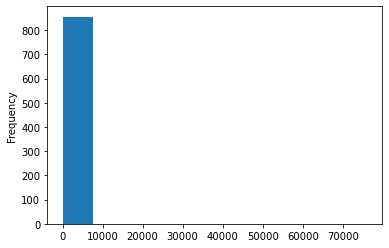

In [19]:
# Busca pela maior incidência de valor (Range entre 0 e 76000)
dfx['COTAÇÃO ATUAL'].loc[lambda x : (x > 0) & (x <= 76000)].plot.hist()

<AxesSubplot:ylabel='Frequency'>

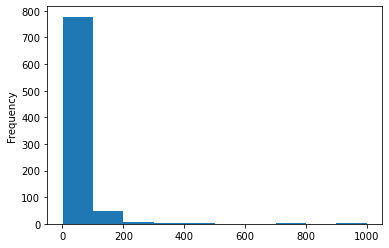

In [20]:
# Busca pela maior incidência de valor(reduzindo o range)
dfx['COTAÇÃO ATUAL'].loc[lambda x : (x > 0) & (x < 1000)].plot.hist()

<AxesSubplot:ylabel='Frequency'>

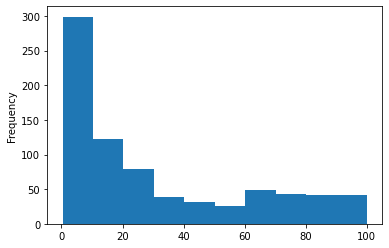

In [21]:
# Busca pela maior incidência de valor(reduzindo o range)
dfx['COTAÇÃO ATUAL'].loc[lambda x : (x > 0) & (x < 100)].plot.hist()

<AxesSubplot:ylabel='Frequency'>

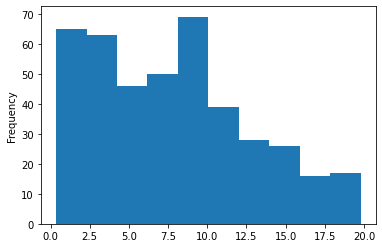

In [23]:
# Busca pela maior incidência de valor(reduzindo o range)
dfx['COTAÇÃO ATUAL'].loc[lambda x : (x > 0) & (x < 20)].plot.hist()

In [24]:
# Verificar maiores incidências de Dividend Yeld
dfx['DIVIDEND YIELD'].value_counts()

0.0000        271
0.0205          4
0.0562          3
0.0594          3
0.0882          3
0.0239          3
0.0262          3
0.0111          3
0.0472          3
0.0959          2
0.0220          2
0.1275          2
0.0836          2
0.0649          2
0.1903          2
0.0351          2
0.0531          2
0.0792          2
0.1411          2
0.0188          2
0.0913          2
0.0001          2
0.0569          2
0.0804          2
0.0800          2
0.0879          2
0.0918          2
0.0364          2
0.0361          2
0.0894          2
0.0658          2
0.1825          2
0.1022          2
0.0662          2
0.1045          2
0.1750          2
0.0473          2
0.0652          2
0.0026          2
0.0027          2
0.0341          2
0.1024          2
0.1284          2
0.1171          2
0.1603          2
0.0547          2
0.1122          2
0.1703          2
0.0271          2
0.0540          2
0.0333          2
0.0772          2
0.0826          2
0.1101          2
0.0874          2
0.0088    

<AxesSubplot:ylabel='Frequency'>

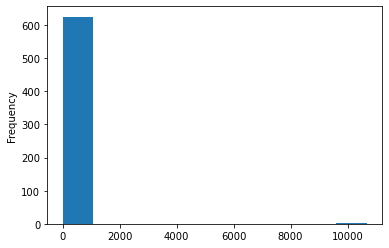

In [25]:
# Localizar as maiores incidências
dfx['DIVIDEND YIELD'].loc[lambda x : (x > 0) & (x <= 10681)].plot.hist()

<AxesSubplot:ylabel='Frequency'>

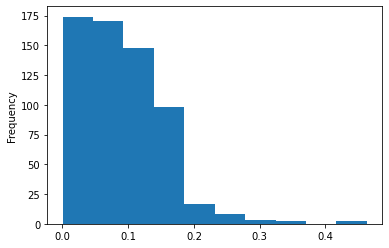

In [26]:
# Localizar as maiores incidências <0.5
dfx['DIVIDEND YIELD'].loc[lambda x : (x > 0) & (x <= 0.5)].plot.hist()

30.211817168338907

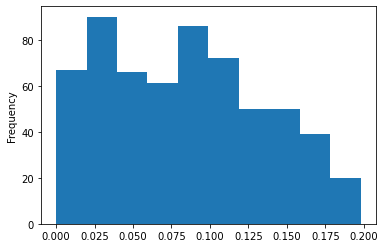

In [27]:
# Localizar as maiores incidências <0.5
dfx['DIVIDEND YIELD'].loc[lambda x : (x > 0) & (x <= 0.2)].plot.hist()
# Verificar % de Dividend Yeld == 0 (30.21%)
#(271/897)*100

In [28]:
# Análise da variável CAGR (Temos valores negativos nesse caso)
dfx['CAGR LUCRO'].value_counts()

 0.0000        419
 0.1041          7
 0.2046          4
 0.0147          4
 0.0673          3
 0.6170          3
-0.2356          3
 0.3495          3
 0.1746          3
 0.2378          3
 0.4729          3
 0.0881          3
 0.0801          3
 0.5455          3
 0.1919          3
 0.5467          3
-0.0249          3
 0.2528          3
 0.3057          3
-0.0511          3
-0.3731          3
 0.1364          3
 0.2272          3
 0.0853          3
 0.2265          3
 0.1091          3
 0.3076          3
 0.3437          3
 0.3253          3
-0.0285          3
-0.1061          3
-0.5898          2
-0.0289          2
-0.1963          2
 0.4750          2
-0.3666          2
 0.0874          2
 0.1811          2
 0.5206          2
-0.0238          2
 0.2246          2
 0.1274          2
 0.0782          2
-0.1289          2
-0.0089          2
 0.1306          2
 0.0379          2
-0.0225          2
 0.0442          2
-0.0221          2
 0.1416          2
 20159.0000      2
 0.4642     

<AxesSubplot:ylabel='Frequency'>

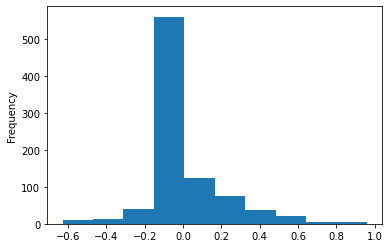

In [29]:
# Localizar as maiores incidências de CAGR 
dfx['CAGR LUCRO'].loc[lambda x : (x > -1.0) & (x <= 1.0)].plot.hist()

<AxesSubplot:ylabel='Frequency'>

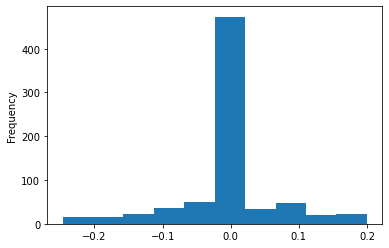

In [32]:
# Zoom na maior concentração de ocorrências de CAGR
dfx['CAGR LUCRO'].loc[lambda x : (x > -0.25) & (x <= 0.2)].plot.hist()

In [31]:
#Overview dos dados (Atenção para as correlações)
ProfileReport(dfx)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
# Vamos excluir a variável preditora e criar a mesma fórmula no python
dfx = dfx.drop(['INVESTIR'], axis=1)

In [ ]:
df = dfx[dfx['TIPO'] == 'AÇÃO']

In [ ]:
#Visualização dos setores das ações
df.value_counts(df['SETOR'])

In [ ]:
#filtrar ações por setor

df['CAGR LUCRO'].replace('-', 0)
#display(df)

# Filtrar o DataFrame para obter apenas os setores das ações

Uti_Púb = df[df['SETOR'] == 'Utilidade Pública']
Bens_Ind = df[df['SETOR'] == 'Bens Industriais']
Mat_Básico = df[df['SETOR'] == 'Materiais Básicos']
Cons_Cíclico = df[df['SETOR'] == 'Consumo Cíclico']
Cons_n_Cícl = df[df['SETOR'] == 'Consumo não Cíclico']
Saúde = df[df['SETOR'] == 'Saúde']
Fin_e_Outros = df[df['SETOR'] == 'Financeiro e Outros']
Tec_da_Info = df[df['SETOR'] == 'Tecnologia da Informação']
Petr_Gás_e_Biocomb = df[df['SETOR'] == 'Petróleo, Gás e Biocombustíveis']

#lista para unir os DataFrames de cada setor
ma=[]

ma.append(Cons_Cíclico)
ma.append(Fin_e_Outros)
ma.append(Uti_Púb)
ma.append(Bens_Ind)
ma.append(Mat_Básico)
ma.append(Cons_n_Cícl)
ma.append(Saúde)
ma.append(Tec_da_Info)
ma.append(Petr_Gás_e_Biocomb)

# lista com os nomes de cada setor (para faciltar)
ma2=[]

ma2.append('Cons_Cíclico')
ma2.append('Fin_e_Outros')
ma2.append('Uti_Púb')
ma2.append('Bens_Ind')
ma2.append('Mat_Básico')
ma2.append('Cons_n_Cícl')
ma2.append('Saúde')
ma2.append('Tec_da_Info')
ma2.append('Petr_Gás_e_Biocomb')

dfa = pd.DataFrame(zip(ma))

display(ma)

#média do dy
media = Cons_Cíclico['DIVIDEND YIELD'].mean()
print("Média da coluna 'DIVIDEND YIELD':\033[1;32m", media, '\033[m')

# gráfico com a média de cada setor

In [ ]:
#média
cont = 0
for c in ma:
    media = c['COTAÇÃO ATUAL'].mean()
    #print(c)
    print("Média da coluna 'COTAÇÃO ATUAL' do setor {}:\033[1;32m".format(ma2[cont]), media, '\033[m')
    cont += 1

In [ ]:
import matplotlib.pyplot as plt

cont = 0
medias = []

for c in ma:
    # Verifique a estrutura dos dados e as colunas corretas
    if 'DIVIDEND YIELD' in c:
        media = c['DIVIDEND YIELD'].mean()
        medias.append(media)
    else:
        medias.append(0)  # Trate o caso em que a coluna não existe ou não tem valores

    cont += 1

# Plotando o gráfico
plt.bar(ma2, medias, width=0.5)
plt.xlabel('Setor')
plt.ylabel('Média da coluna "DIVIDEND YIELD"')
plt.title('Média da coluna "DIVIDEND YIELD" por setor')
plt.xticks(rotation=45, ha='right')
plt.ylim(top=0.170)
plt.tight_layout()
plt.subplots_adjust(bottom=0.2)  # Ajusta o espaço inferior para acomodar os rótulos

plt.show()



In [ ]:
cont = 0
medias = []

for c in ma:
    # Verifique a estrutura dos dados e as colunas corretas
    if 'COTAÇÃO ATUAL' in c:
        media = c['COTAÇÃO ATUAL'].mean()
        medias.append(media)
    else:
        medias.append(0)  # Trate o caso em que a coluna não existe ou não tem valores

    cont += 1

# Plotando o gráfico
plt.bar(ma2, medias, width=0.5)
plt.xlabel('Setor')
plt.ylabel('Média da coluna "COTAÇÃO ATUAL"')
plt.title('Média da coluna "COTAÇÃO ATUAL" por setor')
plt.xticks(rotation=45, ha='right')
plt.ylim(top=175)
plt.tight_layout()
plt.subplots_adjust(bottom=0.2)  # Ajusta o espaço inferior para acomodar os rótulos

plt.show()

In [ ]:
df.info()

In [ ]:
#display(Híbrido)
#tirar ERCR11

#display(Lajes_Corp)
#tirar BLMO11, BBFI11B(analisar) 

In [ ]:
cont = 0
medias = []

for c in ma:
    # Verifique a estrutura dos dados e as colunas corretas
    if 'CAGR LUCRO' in c:
        media = c['CAGR LUCRO'].mean()
        medias.append(media)
    else:
        medias.append(0)  # Trate o caso em que a coluna não existe ou não tem valores

    cont += 1

# Plotando o gráfico
plt.bar(ma2, medias, width=0.5)
plt.xlabel('Setor')
plt.ylabel('Média da coluna "CAGR LUCRO"')
plt.title('Média da coluna "CAGR LUCRO" por setor')
plt.xticks(rotation=45, ha='right')
plt.ylim(top=0.2)#, bottom=-0.20
plt.tight_layout()
plt.subplots_adjust(bottom=0.2)  # Ajusta o espaço inferior para acomodar os rótulos

plt.show()

In [ ]:
#display(Cons_Cíclico)
#tirar MYPK3

#display(Uti_Púb)
#tirar CPRE3, ENMT3, ENMT4

#display(Mat_Básico)
#tirar CSNA3

#display(Tec_da_Info)
#tirar BRQB3

#display(Petr_Gás_e_Biocomb)
#tirar PRIO3

In [ ]:
cont = 0
medias = []

for c in ma:
    # Verifique a estrutura dos dados e as colunas corretas
    if 'LIQUIDEZ DIÁRIA' in c:
        media = c['LIQUIDEZ DIÁRIA'].mean()
        medias.append(media)
    else:
        medias.append(0)  # Trate o caso em que a coluna não existe ou não tem valores

    cont += 1

# Plotando o gráfico
plt.bar(ma2, medias, width=0.5)
plt.xlabel('Setor')
plt.ylabel('Média da coluna "LIQUIDEZ DIÁRIA"')
plt.title('Média da coluna "LIQUIDEZ DIÁRIA" por setor')
plt.xticks(rotation=45, ha='right')
#plt.ylim(top=1)#, bottom=-0.20
plt.tight_layout()
plt.subplots_adjust(bottom=0.2)  # Ajusta o espaço inferior para acomodar os rótulos

plt.show()

In [ ]:
cont = 0
medias = []

for c in ma:
    # Verifique a estrutura dos dados e as colunas corretas
    if 'P/VP' in c:
        media = c['P/VP'].mean()
        medias.append(media)
    else:
        medias.append(0)  # Trate o caso em que a coluna não existe ou não tem valores

    cont += 1

# Plotando o gráfico
plt.bar(ma2, medias, width=0.5)
plt.xlabel('Setor')
plt.ylabel('Média da coluna "P/VP"')
plt.title('Média da coluna "P/VP" por setor')
plt.xticks(rotation=45, ha='right')
plt.ylim(top=25, bottom=-0.20)#
plt.tight_layout()
plt.subplots_adjust(bottom=0.2)  # Ajusta o espaço inferior para acomodar os rótulos

plt.show()

In [ ]:
display(Fin_e_Outros)
# tirar BTTL4, PPLA11, SPRT3B

In [ ]:
df2 = dfx[dfx['TIPO'] == 'FUNDO']
display(df2)

In [ ]:
df2.shape

In [ ]:
#Verificar os tipos dos dados para buscar e corrigir inconsistências
df2.info()

In [ ]:
#Transformando colunas de texto em colunas de número
#coerce == deixar vazio (Pandas não reconhece o simbolo"-")
#df2 = df2['CAGR'].replace('-', 0)
#df2 = df2.drop(['CAGR'], axis=1)

df2['LIQUIDEZ DIÁRIA'] = df2['LIQUIDEZ DIÁRIA'].replace('-', 0)
df2['P/VP'] = df2['P/VP'].replace('-', 0)
df2['CAGR LUCRO'] = df2['CAGR LUCRO'].replace('-', 0)
df2['CAIXA'] = df2['CAIXA'].replace('-', 0)
df2['LUCRO'] = df2['LUCRO'].replace('-', 0)

df2['LIQUIDEZ DIÁRIA'] = df2['LIQUIDEZ DIÁRIA'].astype('float64')
df2['P/VP'] = df2['P/VP'].astype('float64')
df2['CAGR LUCRO'] = df2['CAGR LUCRO'].astype('float64')
df2['CAIXA'] = df2['CAIXA'].astype('float64')
df2['LUCRO'] = df2['LUCRO'].astype('float64')

In [ ]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

#display(Cons_Cíclico)
#tirar MYPK3

#display(Uti_Púb)
#tirar CPRE3, ENMT3, ENMT4

#display(Mat_Básico)
#tirar CSNA3

#display(Tec_da_Info)
#tirar BRQB3

#display(Petr_Gás_e_Biocomb)
#tirar PRIO3

In [ ]:
df2.value_counts(df2['SETOR'])

In [ ]:
#Confirmar se as alterações de objeto para numérico deram certo
df2.info()

In [ ]:
'''#código automação fundos part 1

#FUNDOS
df2 = pd.read_excel('fundos_junho.xlsx')
#planilha em excel adquirida por meio do projeto em python abaixo

df2 = df2.drop(['Unnamed: 0'], axis=1)
#display(df2)
# df2 será a variável que terá nosso DataFrame'''

In [ ]:
'''#código automação fundos part 2 

navegador = webdriver.Chrome()
navegador.get('https://www.google.com')
link = 'https://statusinvest.com.br/'
navegador.get(link)
print(link)
#as funcões acima servem para o selenium entrar no site statusinvest, onde tiraremos nossas informações

py.keyDown('win')
py.press('up')
py.keyUp('win')

codigo = []
setor = []
tipo = []
maxima = []
minima = []
cot_atual = []
dy = []
liq_dia = []
patrim = []
caixa = []
cagr = []
pvp = []
#estas listas acima são todas as informações que pegaremos do site, nas quais serão transformadas em um DataFrame depois

for c in df2['TICKER']:
    #Looping 'for' para pegar cada ticker(código) das ações no DataFrame
    codigo.append(c)
    navegador.find_element('xpath', '//*[@id="main-nav-nav"]/div/div/div/ul/li[2]/a/i').click()
    navegador.find_element('xpath', '//*[@id="main-search"]/div[1]/span[1]/input[2]').send_keys(c)
    try:
        sl(3)
        navegador.find_element('xpath', '//*[@id="main-search"]/div[2]/div/div/a').click()
        
    except:
        sl(2)
        navegador.find_element('xpath', '//*[@id="main-search"]/div[2]/div/div/a').click()
    #tratamento de erro usado aqui para prevenir erros enquanto o programa está funcionando, se houver um 
    #erro o progresso será pausado
        
    tipo.append(navegador.find_element('xpath', '//*[@id="main-header"]/div[2]/div/div[1]/div/ol/li[2]/a/span').text)
    
    cot_atual.append(navegador.find_element('xpath', '//*[@id="main-2"]/div[2]/div[1]/div[1]/div/div[1]/strong').text)
    
    maxima.append(navegador.find_element('xpath', '//*[@id="main-2"]/div[2]/div[1]/div[3]/div/div[1]/strong').text)
    #                                              //*[@id="main-2"]/div[2]/div[1]/div[3]/div/div[1]/strong
    
    minima.append(navegador.find_element('xpath', '//*[@id="main-2"]/div[2]/div[1]/div[2]/div/div[1]/strong').text)
    
    dy.append(navegador.find_element('xpath', '//*[@id="main-2"]/div[2]/div[1]/div[4]/div/div[1]/strong').text)
    
    py.scroll(-1200)
    sl(0.5)
    try:
        pvp.append(navegador.find_element('xpath', '//*[@id="main-2"]/div[2]/div[4]/div/div[2]/div/div[1]/strong').text)
    except:
        pvp.append(navegador.find_element('xpath', '//*[@id="main-2"]/div[2]/div[5]/div/div[2]/div/div[1]/strong').text)                                          
    
    try:
        patrim.append(navegador.find_element('xpath', '//*[@id="main-2"]/div[2]/div[4]/div/div[1]/div/div[2]/span[2]').text)
    except:
        patrim.append(navegador.find_element('xpath', '//*[@id="main-2"]/div[2]/div[5]/div/div[1]/div/div[2]/span[2]').text)
    try:  
        caixa.append(navegador.find_element('xpath', '//*[@id="main-2"]/div[2]/div[4]/div/div[2]/div/div[2]/span[2]').text)
    except:
        caixa.append(navegador.find_element('xpath', '//*[@id="main-2"]/div[2]/div[5]/div/div[2]/div/div[2]/span[2]').text)
    try:    
        cagr.append(navegador.find_element('xpath', '//*[@id="main-2"]/div[2]/div[4]/div/div[5]/div/div[1]/strong').text)
    except:
        cagr.append(navegador.find_element('xpath', '//*[@id="main-2"]/div[2]/div[5]/div/div[5]/div/div[1]/strong').text)
    try:    
        liq_dia.append(navegador.find_element('xpath', '//*[@id="main-2"]/div[2]/div[6]/div/div/div[3]/div/div/div/strong').text)
    except:
        liq_dia.append(navegador.find_element('xpath', '//*[@id="main-2"]/div[2]/div[5]/div/div/div[3]/div/div/div/strong').text)
        
    navegador.find_element('xpath', '//*[@id="main-2"]/div[1]/div/div/ul/li[2]/a').click()
    sl(0.5)
    py.scroll(-250)
    sl(0.3)
    try:
        setor.append(navegador.find_element('xpath', '//*[@id="fund-section"]/div/div/div[4]/div/div[1]/div/div/div/a/strong').text)
    except:                                           
        setor.append(navegador.find_element('xpath', '//*[@id="fund-section"]/div/div/div[5]/div/div[1]/div/div/div/a/strong').text)
    #funções da biblioteca selenium para pegar informações do site e colocá-las em suas respectivas listas 
    #(por isso usei a função append também)'''

In [ ]:
display(df2)

In [ ]:
df2.info()

In [ ]:
df2.value_counts(df2['SETOR'])

In [ ]:
#filtro dos fundos

#setores fundos
Tit_e_Val_Mob = df2[df2['SETOR'] == 'Títulos e Val. Mob.']
Laj_Corp = df2[df2['SETOR'] == 'Lajes Corporativas']
Hotel = df2[df2['SETOR'] == 'Hotel']
Residencial = df2[df2['SETOR'] == 'Residencial']
Hospital = df2[df2['SETOR'] == 'Hospital']
Fiagro = df2[df2['SETOR'] == 'Fiagro']
Shoppings = df2[df2['SETOR'] == 'Shoppings']
Outros = df2[df2['SETOR'] == 'Outros']
Hotel = df2[df2['SETOR'] == 'Logística']
Renda = df2[df2['SETOR'] == 'Renda']
Híbrido = df2[df2['SETOR'] == 'Híbrido']

mf=[]
mf.append(Tit_e_Val_Mob)
mf.append(Laj_Corp)
mf.append(Hotel)
mf.append(Residencial)
mf.append(Hospital)
mf.append(Fiagro)
mf.append(Shoppings)
mf.append(Outros)
mf.append(Hotel)
mf.append(Renda)
mf.append(Híbrido)

mf2=[]

mf2.append('Tit_e_Val_Mob')
mf2.append('Laj_Corp')
mf2.append('Hotel')
mf2.append('Residencial')
mf2.append('Hospital')
mf2.append('Fiagro')
mf2.append('Shoppings')
mf2.append('Outros')
mf2.append('Hotel')
mf2.append('Renda')
mf2.append('Híbrido')

#display(mf)

In [ ]:
cont = 0
medias = []

for c in mf:
    # Verifique a estrutura dos dados e as colunas corretas
    if 'COTAÇÃO ATUAL' in c:
        media = c['COTAÇÃO ATUAL'].mean()
        medias.append(media)
    else:
        medias.append(0)  # Trate o caso em que a coluna não existe ou não tem valores

    cont += 1

# Plotando o gráfico
plt.bar(mf2, medias, width=0.5)
plt.xlabel('Setor')
plt.ylabel('Média da coluna "COTAÇÃO"')
plt.title('Média da coluna "COTAÇÃO" por setor')
plt.xticks(rotation=45, ha='right')
plt.ylim(top=800, bottom=0)
plt.tight_layout()
plt.subplots_adjust(bottom=0.2)  # Ajusta o espaço inferior para acomodar os rótulos

plt.show()

#criar gráficos (cotação, cagr e dy)

In [ ]:
#display(Híbrido)
#excluir STRX11, ERCR11

In [ ]:
cont = 0
medias = []

for c in mf:
    # Verifique a estrutura dos dados e as colunas corretas
    if 'DIVIDEND YIELD' in c:
        media = c['DIVIDEND YIELD'].mean()
        medias.append(media)
    else:
        medias.append(0)  # Trate o caso em que a coluna não existe ou não tem valores

    cont += 1

# Plotando o gráfico
plt.bar(mf2, medias, width=0.5)
plt.xlabel('Setor')
plt.ylabel('Média da coluna "DIVIDEND YIELD"')
plt.title('Média da coluna "DIVIDEND YIELD" por setor')
plt.xticks(rotation=45, ha='right')
plt.ylim(top=0.25)#, bottom=-0.20
plt.tight_layout()
plt.subplots_adjust(bottom=0.2)  # Ajusta o espaço inferior para acomodar os rótulos

plt.show()

In [ ]:
#média
cont = 0
for c in mf:
    media = c['CAGR LUCRO'].mean()
    #print(c)
    print("Média da coluna 'CAGR LUCRO' do setor {}:\033[1;32m".format(mf2[cont]), media, '\033[m')
    cont += 1


In [ ]:
cont = 0
medias = []

for c in mf:
    # Verifique a estrutura dos dados e as colunas corretas
    if 'CAGR LUCRO' in c:
        media = c['CAGR LUCRO'].mean()
        medias.append(media)
    else:
        medias.append(0)  # Trate o caso em que a coluna não existe ou não tem valores

    cont += 1

# Plotando o gráfico
plt.bar(mf2, medias, width=0.5)
plt.xlabel('Setor')
plt.ylabel('Média da coluna "CAGR LUCRO"')
plt.title('Média da coluna "CAGR LUCRO" por setor')
plt.xticks(rotation=45, ha='right')
#plt.ylim(top=0.2)#, bottom=-0.20
plt.tight_layout()
plt.subplots_adjust(bottom=0.2)  # Ajusta o espaço inferior para acomodar os rótulos

plt.show()

In [ ]:
cont = 0
medias = []

for c in mf:
    # Verifique a estrutura dos dados e as colunas corretas
    if 'LIQUIDEZ DIÁRIA' in c:
        media = c['LIQUIDEZ DIÁRIA'].mean()
        medias.append(media)
    else:
        medias.append(0)  # Trate o caso em que a coluna não existe ou não tem valores

    cont += 1

# Plotando o gráfico
plt.bar(mf2, medias, width=0.5)
plt.xlabel('Setor')
plt.ylabel('Média da coluna "LIQUIDEZ DIÁRIA"')
plt.title('Média da coluna "LIQUIDEZ DIÁRIA" por setor')
plt.xticks(rotation=45, ha='right')
#plt.ylim(top=10000000)#, bottom=-0.20
plt.tight_layout()
plt.subplots_adjust(bottom=0.2)  # Ajusta o espaço inferior para acomodar os rótulos

plt.show()

In [ ]:
display(Outros)

In [ ]:
cont = 0
medias = []

for c in mf:
    # Verifique a estrutura dos dados e as colunas corretas
    if 'P/VP' in c:
        media = c['P/VP'].mean()
        medias.append(media)
    else:
        medias.append(0)  # Trate o caso em que a coluna não existe ou não tem valores

    cont += 1

# Plotando o gráfico
plt.bar(mf2, medias, width=0.5)
plt.xlabel('Setor')
plt.ylabel('Média da coluna "P/VP"')
plt.title('Média da coluna "P/VP" por setor')
plt.xticks(rotation=45, ha='right')
plt.ylim(top=1.5)#, bottom=-0.20
plt.tight_layout()
plt.subplots_adjust(bottom=0.2)  # Ajusta o espaço inferior para acomodar os rótulos

plt.show()

In [ ]:
## Criar matriz de confusão para investir "Sim" e "Não": (Exemplo do R)
'''> table(Fumador, Classificacao)
       Classificacao
Fumador Clas.Fuma Clas.NãoFuma
      0        41           25
      1        49           10
> '''

In [ ]:
# definir nova regra para a variável preditora

# Análise de clusters

# definir modelo e ver qual é mais assertivo (Regressão linear ou Arvore de decisão)

In [ ]:
#print("Q1:",np.quantile(idade_vetor, q=0.25))

In [ ]:
#print("Q2:",np.quantile(idade_vetor, q=0.5))

In [ ]:
#print("Q3:",np.quantile(idade_vetor, q=0.75))

In [ ]:
#print("Q4:",np.quantile(idade_vetor, q=1))

In [ ]:
#deploy
atributo_filtro = []


def analise(setor, atributo, dy, ld, pvp1, cagr, pl, caixa, lucro, pvp2=0):
    for valor in setor[atributo]:
        if atributo == 'DIVIDEND YIELD':
            if valor > dy:
                atributo_filtro.append('bom')
            else:
                atributo_filtro.append('ruim')
                
        elif atributo == 'LIQUIDEZ DIÁRIA':
            if valor > ld:
                atributo_filtro.append('bom')
            else:
                atributo_filtro.append('ruim')
                
        elif atributo == 'P/VP':
            if valor < pvp1 and valor > pvp2:
                atributo_filtro.append('bom')
            else:
                atributo_filtro.append('ruim')
                
        elif atributo == 'CAGR LUCRO':
            if valor > cagr:
                atributo_filtro.append('bom')
            else:
                atributo_filtro.append('ruim')
                
        elif atributo == 'PATRIMÔNIO LÍQUIDO':
            if valor > pl:
                atributo_filtro.append('bom')
            else:
                atributo_filtro.append('ruim')
                
        elif atributo == 'CAIXA':
            cont = 0
            caixa_filtro = []
            for c in setor['PATRIMÔNIO LÍQUIDO']:
                caixa_filtro.append(c)
                porcentagem = (caixa_filtro[cont] / 100) * caixa
                #print(valor)
                #print(porcentagem)
                #print()
                if valor < porcentagem: # valor = caixa e porcentagem = 30% patrimônio liquido
                    atributo_filtro.append('caixa menor que {}% do PL'.format(caixa))
                else:
                    atributo_filtro.append('caixa maior que {}% do PL'.format(caixa))
                cont +=1   
                break
                
        elif atributo == 'LUCRO':
            if valor > lucro:
                atributo_filtro.append('bom')
            else:
                atributo_filtro.append('ruim')
            
    setor['analise',atributo] = atributo_filtro
    print(setor.value_counts(setor['analise', atributo]))
    display(setor)
    
analise(Consumo_Cíclico, 'CAIXA', dy = 0.06,ld= 1000000,pvp1=1.05,pvp2=0.6,cagr=0.10,pl=10000000,caixa=20,lucro=0)

In [ ]:
ProfileReport(df_filtrado)

In [ ]:
#pensar no deployment